In [1]:
import torch
# torch.autograd.set_detect_anomaly(True)
from torch.utils.data import DataLoader,WeightedRandomSampler
from torch.optim.lr_scheduler import PolynomialLR
import torch.nn.functional as F
from torchvision.transforms import v2

import albumentations as A
from albumentations.pytorch import ToTensorV2
import segmentation_models_pytorch as smp

from tqdm.notebook import tqdm
import json
import cv2
import matplotlib.pyplot as plt
import numpy as np
import random
import os
###IE###
%load_ext autoreload
%autoreload 2
from utils.helpers import (
    plot_some_images ,read_images ,
    pre_hard_skeletonize , pre_soft_skeletonize,
    compute_confution_matrix,draw_mask,TP_TN_FP_FN,)
from utils.preprocessing import (
    WhiteTopHat , CLAHE , normalize_xca,
    BrightnessMultiplicativeNNUNet2D,
    ContrastAugmentationNNUNet2D)
from utils.dataset import  (
    TrainUnetDataset  
)
from models.nnunet import nnUnet
from models.memory_unet import MemoryUnet
from utils.losses import UnetLoss
from utils.recorder import HistoryRecorder
from logger import save_full_report
from trainer import trainer
###SS###
from trainer import evaluation

In [2]:
args = {
    "base_path" : "./dataset/syntax/",
    "memory_unet":{
        "layer_count":4,
        "channel_max":256,
        "downsampling":"maxpool",
        "normaliztion":"InstanceNorm2d",
        "activation" : "LeakyReLU",
        "first_layer_out_c" : 64
    },
    "image_shape" : (448,448),
    "in_c":1,
    
    "training_mode":"binary",
    "report_class_wise":True,
    "attention" : False,
    "batch_size" : 8,
    "num_workers" : 5,
    "device" : "cuda" if torch.cuda.is_available() else "cpu",
    "epcohs":10,
    "f_int_scale" : 2,
    "full_report_cycle" : 1,
    "max_channels":512,
    "loss_type":"tversky",
    "output_base_path" : "./outputs",
    "name" : "resnet-seq-lstm-tests-final",
    "deep_super_vision" : False,
    "mask_ce_weights":None,
    "layer_count":5,
    ### Loss Functions
    "mask_ce_conf":{
        "imp_coef":1.0
    },
    "focal_ce_conf":{
        "gamma":2.0,
        "loss_scale":1.0,
        "imp_coef":1.0
    },
    "tversky_conf":{
        "alpha":0.1,
        "beta":0.9,
        "gamma":2.00,
        "weights":None,
        "imp_coef":1.0
    },
    "cl_dice_conf":{
        "imp_coef":1.0,
        "k":40
    },
    ### Optimizers
    "sgd_conf":{
        "lr" : 0.1,
        "momentum" : 0.99,
        "weight_decay" : 3e-5,
        "nesterov":True
    },
    "adam_conf":{
        "lr" : 0.01,
        "weight_decay" : 3e-5,
    }
}
if(args["training_mode"] == "binary"):
    args["class_count"] = 2 
    class_map = {
        1:"fg"
    }

else:
    args["class_count"] = 26
    class_map = {
        1: '1',2: '2', 3: '3',4: '4',
        5: '5',6: '6',7:'9',8:'7',9:'9a',
        10:'10',11:'8',12:'10a',13:'12',14:'11',
        15:'12a',16:'12b',17:'13',18:'14',19:'14a',
        20:'14b',21:'15',22:'16',
        23: '16a',24: '16b',25: '16c',
    }

# losses_keys = ["total loss","FCE loss",args["loss_type"]]
losses_keys = ["total loss","mask CE-Loss",args["loss_type"],"cl dice loss"]
out_counts = args["layer_count"] if args["deep_super_vision"] else 1
loss_weights = [1/(2**i) for i in range(out_counts)]
loss_weights



[1.0]

In [3]:
if(args["training_mode"]!="binary"):
    b=0.999

    train_class_counts = [
        1200,374,375,369,303,525,537,
        198,340,70,21,310,1,61,320,129,
        63,305,107,49,127,38,232,43,48,31
    ]

    total = np.sum(train_class_counts)
    mask_ce_weights = np.log(total/np.array(train_class_counts))
    mask_ce_weights = (mask_ce_weights / mask_ce_weights.mean()).tolist()
    mask_ce_weights[0]=0.1

    args["mask_ce_weights"]=mask_ce_weights
    args["mask_ce_weights"]
else:
    args["mask_ce_weights"]=[0.1,1]

In [4]:
# args["t_alpha"] = [1,0.8]
args["tversky_conf"]["t_alpha"] = None

In [5]:
train_transforms = A.Compose([
    A.Resize(*args["image_shape"]),
    A.Downscale(
        scale_range=[0.7, 1],
        interpolation_pair={"downscale": 0, "upscale": 0},
        p=0.5
    ),
    A.GaussNoise(
        std_range=[0.0, 0.1],
        mean_range=[0, 0],
        per_channel=True,
        noise_scale_factor=1,
        p=0.5
    ),
    A.GaussianBlur(
        sigma_limit=[1.0,1.5],
        blur_limit = (3,7),
        p=0.5
    ),

    A.OneOf([
        A.ElasticTransform(
            alpha=120, 
            sigma=120 * 0.05, 
            p=1.0
        ),
        A.GridDistortion(num_steps=5, distort_limit=0.3, p=1.0),
        A.OpticalDistortion(distort_limit=0.2, p=1.0),
    ], p=0.5),
    A.Compose([
        A.InvertImg(p=1.0),
        A.RandomGamma(gamma_limit=(70, 150), p=1.0),
        A.InvertImg(p=1.0),
    ], p=0.5),
    BrightnessMultiplicativeNNUNet2D(multiplier_range=(0.70, 1.3), p=0.5),
    ContrastAugmentationNNUNet2D(contrast_range=(0.65, 1.5), p=0.5),
    A.RandomGamma(
        gamma_limit=(90, 120), 
        p=0.5
    ),
    A.Affine(
        scale=(0.7, 1.4),  
        translate_percent=(0, 0),
        rotate=0,               
        shear=0,                 
        fit_output=False, 
        p=0.5
    ),
    A.Rotate(limit=30, p=0.5, fill_mask = 0),
    A.Rotate(limit=-30, p=0.5, fill_mask = 0),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),

    ]
)
test_transforms = A.Compose([
    A.Resize(*args["image_shape"]),
    ]  
)

if(args["in_c"]==1):
    normalizer = normalize_xca
else:
    normalizer = A.Normalize(
        mean=(0.485, 0.456, 0.406),
        std=(0.229, 0.224, 0.225),
        max_pixel_value=255.0,
    )
train_preprocess = None


/home/parsa/Masters/Coronary Artry/Datasets/Arcade/codes/utils/preprocessing.py:48: UserWarning: Argument(s) 'always_apply' are not valid for transform BasicTransform
  super().__init__(always_apply=always_apply, p=p)
/home/parsa/Masters/Coronary Artry/Datasets/Arcade/codes/utils/preprocessing.py:61: UserWarning: Argument(s) 'always_apply' are not valid for transform BasicTransform
  super().__init__(always_apply=always_apply, p=p)


In [6]:
train_images = read_images(base_path = args["base_path"],preprocessor = train_preprocess,part = "train",chosen_labels=[19,25])
valid_images = read_images(base_path = args["base_path"],preprocessor = train_preprocess,part = "val",chosen_labels=[19,25])


NOTE : preprocessor is not defined . no preprocessing will be used !


  0%|          | 0/1000 [00:00<?, ?it/s]

NOTE : preprocessor is not defined . no preprocessing will be used !


  0%|          | 0/200 [00:00<?, ?it/s]

In [7]:

train_ds = TrainUnetDataset(
    transform = train_transforms,
    data = train_images , 
    normalizer = normalizer,
    example_phase=False
)
valid_ds = TrainUnetDataset(
    transform = test_transforms,
    data = valid_images,
    normalizer = normalizer,
    example_phase=False
)
# sampler = WeightedRandomSampler(
#     weights=sampler_weights, 
#     num_samples=len(sampler_weights),
#     replacement=True)

train_loader = DataLoader(
    train_ds,
    batch_size = args["batch_size"] ,
    num_workers = args["num_workers"] ,
    pin_memory=True,
    shuffle=True
    # sampler=sampler
)
valid_loader = DataLoader(
    valid_ds,
    batch_size = args["batch_size"]  ,
    num_workers = args["num_workers"] ,
    pin_memory=True,
    shuffle=False
)


In [8]:

# model = nnUnet(args).to(args["device"])
model = MemoryUnet(args).to(args["device"])

loss_fn = UnetLoss(args)
# optimizer = torch.optim.Adam(
#     model.parameters(), 
#     **args["adam_conf"]
# )
optimizer = torch.optim.SGD(
    model.parameters(),
    **args["sgd_conf"]
)
# optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-2)
# lr_sch = PolynomialLR(optimizer=optimizer,total_iters=args["epcohs"],power=0.9)
lr_sch = None
recorder = HistoryRecorder(losses_keys=losses_keys,class_maps =class_map,class_count=args["class_count"]-1)


best_model = trainer(
    args=args,
    recorder = recorder,
    model = model,
    optimizer = optimizer,
    loss_fn = loss_fn,
    train_loader = train_loader,
    valid_loader = valid_loader,
    loss_weights=loss_weights,
    lr_sch = lr_sch
)
# best_model = model


encoder info : 
[1, 64, 128, 256, 256]
-----------------------
loss is set to tversky


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (0)
total loss : 1.223920702457428 - mask CE-Loss : 0.3280228588581085 - tversky : 0.23200064903497697
cl dice loss : 0.6638972005844116 - 
train avg metrics for epoch 0 :
avg dice : 0.37678632140159607 - avg precision : 0.26059967279434204 - avg recall : 0.6799274682998657
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>


  0%|          | 0/25 [00:00<?, ?it/s]

valid ==> epcoh (0)
total loss : 0.9561213397979736 - mask CE-Loss : 0.30600633382797243 - tversky : 0.16560805439949036
cl dice loss : 0.48450695037841796 - 
valid avg metrics for epoch 0 :
avg dice : 0.4982139468193054 - avg precision : 0.3980119228363037 - avg recall : 0.6658445000648499
fg => dice : 0.4982139468193054 p : 0.3980119228363037 , r : 0.6658445000648499
------------------------------------------------------------
New Best! : dice = 0.4982139468193054


  0%|          | 0/125 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.2549, device='cuda:0')
----------------------

current lr : 0.1
train ==> epcoh (1)
total loss : 0.9496243715286254 - mask CE-Loss : 0.2761809996366501 - tversky : 0.1622181371450424
cl dice loss : 0.5112252311706543 - 
train avg metrics for epoch 1 :
avg dice : 0.5162177681922913 - avg precision : 0.41788414120674133 - avg recall : 0.6750710010528564
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>


  0%|          | 0/25 [00:00<?, ?it/s]

valid ==> epcoh (1)
total loss : 0.9045296812057495 - mask CE-Loss : 0.2898871463537216 - tversky : 0.1548839309811592
cl dice loss : 0.45975860834121707 - 
valid avg metrics for epoch 1 :
avg dice : 0.5670446157455444 - avg precision : 0.48880383372306824 - avg recall : 0.6751060485839844
fg => dice : 0.5670446157455444 p : 0.48880383372306824 , r : 0.6751060485839844
------------------------------------------------------------
New Best! : dice = 0.5670446157455444


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (2)
total loss : 0.9024908990859986 - mask CE-Loss : 0.26435327076911924 - tversky : 0.15336790144443513
cl dice loss : 0.4847697267532349 - 
train avg metrics for epoch 2 :
avg dice : 0.5343049168586731 - avg precision : 0.4401782155036926 - avg recall : 0.6796368956565857
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>


  0%|          | 0/25 [00:00<?, ?it/s]

valid ==> epcoh (2)
total loss : 0.8598931360244751 - mask CE-Loss : 0.2721110165119171 - tversky : 0.13807435274124147
cl dice loss : 0.44970777034759524 - 
valid avg metrics for epoch 2 :
avg dice : 0.5903138518333435 - avg precision : 0.5214685797691345 - avg recall : 0.6801022291183472
fg => dice : 0.5903138518333435 p : 0.5214685797691345 , r : 0.6801022291183472
------------------------------------------------------------
New Best! : dice = 0.5903138518333435


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (3)
total loss : 0.8628430781364441 - mask CE-Loss : 0.2560990858078003 - tversky : 0.1471767989397049
cl dice loss : 0.45956719589233397 - 
train avg metrics for epoch 3 :
avg dice : 0.5537593364715576 - avg precision : 0.4652790427207947 - avg recall : 0.6837937831878662
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>


  0%|          | 0/25 [00:00<?, ?it/s]

valid ==> epcoh (3)
total loss : 0.83398508310318 - mask CE-Loss : 0.26771427273750303 - tversky : 0.1499789959192276
cl dice loss : 0.416291811466217 - 
valid avg metrics for epoch 3 :
avg dice : 0.595613420009613 - avg precision : 0.5437479019165039 - avg recall : 0.6584166884422302
fg => dice : 0.595613420009613 p : 0.5437479019165039 , r : 0.6584166884422302
------------------------------------------------------------
New Best! : dice = 0.595613420009613


  0%|          | 0/125 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.2768, device='cuda:0')
----------------------

current lr : 0.1
train ==> epcoh (4)
total loss : 0.8448322777748107 - mask CE-Loss : 0.2541305869817734 - tversky : 0.14710581189393998
cl dice loss : 0.4435958766937256 - 
train avg metrics for epoch 4 :
avg dice : 0.554514467716217 - avg precision : 0.4686053693294525 - avg recall : 0.6789939999580383
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>


  0%|          | 0/25 [00:00<?, ?it/s]

valid ==> epcoh (4)
total loss : 0.8170657634735108 - mask CE-Loss : 0.28762449383735655 - tversky : 0.15552630722522737
cl dice loss : 0.3739149594306946 - 
valid avg metrics for epoch 4 :
avg dice : 0.5957087874412537 - avg precision : 0.5523213148117065 - avg recall : 0.6464939713478088
fg => dice : 0.5957087874412537 p : 0.5523213148117065 , r : 0.6464939713478088
------------------------------------------------------------
New Best! : dice = 0.5957087874412537


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (5)
total loss : 0.8252500395774841 - mask CE-Loss : 0.25183682453632356 - tversky : 0.1443377705216408
cl dice loss : 0.42907544660568236 - 
train avg metrics for epoch 5 :
avg dice : 0.5640785694122314 - avg precision : 0.48502495884895325 - avg recall : 0.6739199757575989
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>


  0%|          | 0/25 [00:00<?, ?it/s]

valid ==> epcoh (5)
total loss : 0.8206899356842041 - mask CE-Loss : 0.2827079290151596 - tversky : 0.15696555912494659
cl dice loss : 0.3810164427757263 - 
valid avg metrics for epoch 5 :
avg dice : 0.5834559798240662 - avg precision : 0.5430299639701843 - avg recall : 0.6303852200508118
fg => dice : 0.5834559798240662 p : 0.5430299639701843 , r : 0.6303852200508118
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (6)
total loss : 0.807235526561737 - mask CE-Loss : 0.2508075166940689 - tversky : 0.1413745657801628
cl dice loss : 0.4150534429550171 - 
train avg metrics for epoch 6 :
avg dice : 0.5677751302719116 - avg precision : 0.48982498049736023 - avg recall : 0.6752303838729858
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>


  0%|          | 0/25 [00:00<?, ?it/s]

valid ==> epcoh (6)
total loss : 0.7981540966033935 - mask CE-Loss : 0.2794345670938492 - tversky : 0.1576517915725708
cl dice loss : 0.36106773614883425 - 
valid avg metrics for epoch 6 :
avg dice : 0.5991085171699524 - avg precision : 0.567706823348999 - avg recall : 0.6341874599456787
fg => dice : 0.5991085171699524 p : 0.567706823348999 , r : 0.6341874599456787
------------------------------------------------------------
New Best! : dice = 0.5991085171699524


  0%|          | 0/125 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.2499, device='cuda:0')
----------------------

current lr : 0.1
train ==> epcoh (7)
total loss : 0.7859550805091858 - mask CE-Loss : 0.24471961426734926 - tversky : 0.13952781563997269
cl dice loss : 0.40170764780044554 - 
train avg metrics for epoch 7 :
avg dice : 0.5687164664268494 - avg precision : 0.49270981550216675 - avg recall : 0.6724503636360168
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>


  0%|          | 0/25 [00:00<?, ?it/s]

valid ==> epcoh (7)
total loss : 0.775621793270111 - mask CE-Loss : 0.23888711273670196 - tversky : 0.11843003928661347
cl dice loss : 0.4183046364784241 - 
valid avg metrics for epoch 7 :
avg dice : 0.6016169190406799 - avg precision : 0.5219925045967102 - avg recall : 0.7099054455757141
fg => dice : 0.6016169190406799 p : 0.5219925045967102 , r : 0.7099054455757141
------------------------------------------------------------
New Best! : dice = 0.6016169190406799


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (8)
total loss : 0.7823499050140381 - mask CE-Loss : 0.245198939204216 - tversky : 0.1390147014260292
cl dice loss : 0.39813626432418825 - 
train avg metrics for epoch 8 :
avg dice : 0.5738421082496643 - avg precision : 0.5004996657371521 - avg recall : 0.672370195388794
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>


  0%|          | 0/25 [00:00<?, ?it/s]

valid ==> epcoh (8)
total loss : 0.748718855381012 - mask CE-Loss : 0.24460517466068268 - tversky : 0.12254228591918945
cl dice loss : 0.38157139778137206 - 
valid avg metrics for epoch 8 :
avg dice : 0.6000029444694519 - avg precision : 0.5308821201324463 - avg recall : 0.6898171305656433
fg => dice : 0.6000029444694519 p : 0.5308821201324463 , r : 0.6898171305656433
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (9)
total loss : 0.764190610408783 - mask CE-Loss : 0.2397683254480362 - tversky : 0.13525655466318132
cl dice loss : 0.38916572809219363 - 
train avg metrics for epoch 9 :
avg dice : 0.5810096859931946 - avg precision : 0.5107803344726562 - avg recall : 0.6736299395561218
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>


  0%|          | 0/25 [00:00<?, ?it/s]

valid ==> epcoh (9)
total loss : 0.7508158683776855 - mask CE-Loss : 0.25948952496051786 - tversky : 0.1416894081234932
cl dice loss : 0.34963693618774416 - 
valid avg metrics for epoch 9 :
avg dice : 0.5913432240486145 - avg precision : 0.5438975691795349 - avg recall : 0.6478576064109802
fg => dice : 0.5913432240486145 p : 0.5438975691795349 , r : 0.6478576064109802
------------------------------------------------------------
best result at epoch 8 with dice 0.6016169190406799


Save Model
Saving Memory
Saving All Plots


  0%|          | 0/25 [00:00<?, ?it/s]

Saving Examples


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

Saving Verbal Results
Copying Notebook To Results
builfding kaggle project


100%|██████████| 12/12 [00:00<00:00, 3241.35it/s]


processing ./utils/dataset.py
processing ./utils/helpers.py
processing ./logger.py
processing ./utils/preprocessing.py
processing ./utils/recorder.py
processing ./models/costume_nnunet_blocks.py
processing ./models/nnunet.py
processing ./models/swin_encoder.py
processing ./models/swin_blocks.py
processing ./models/conv_lstm.py
processing ./utils/losses.py
processing ./trainer.py


100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


processing ./temp_script.py


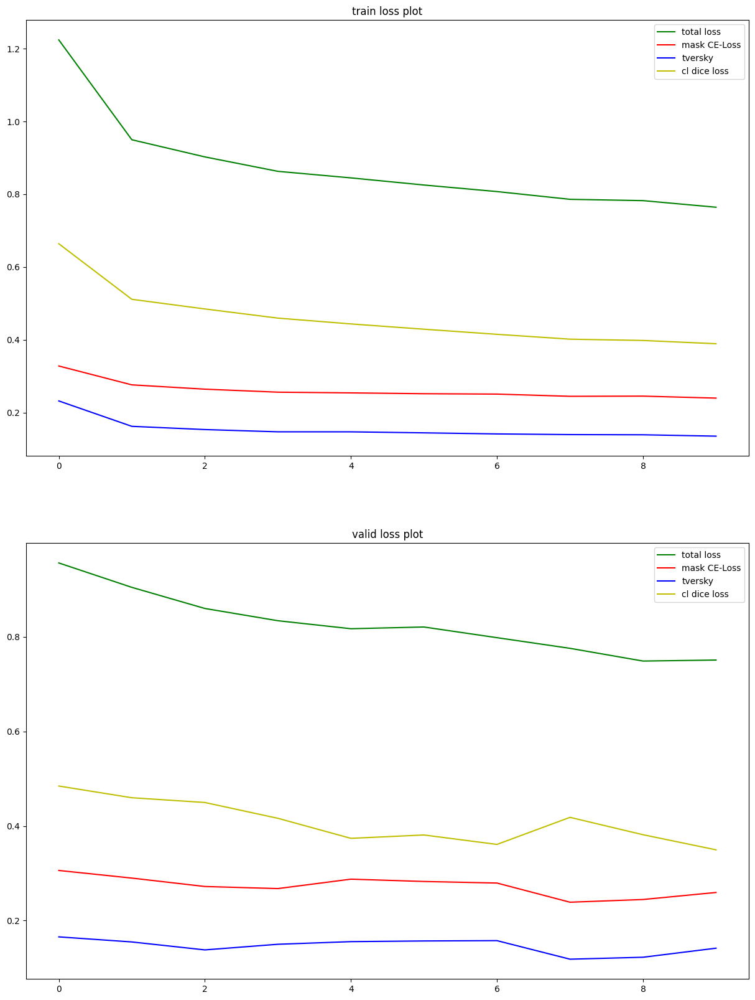

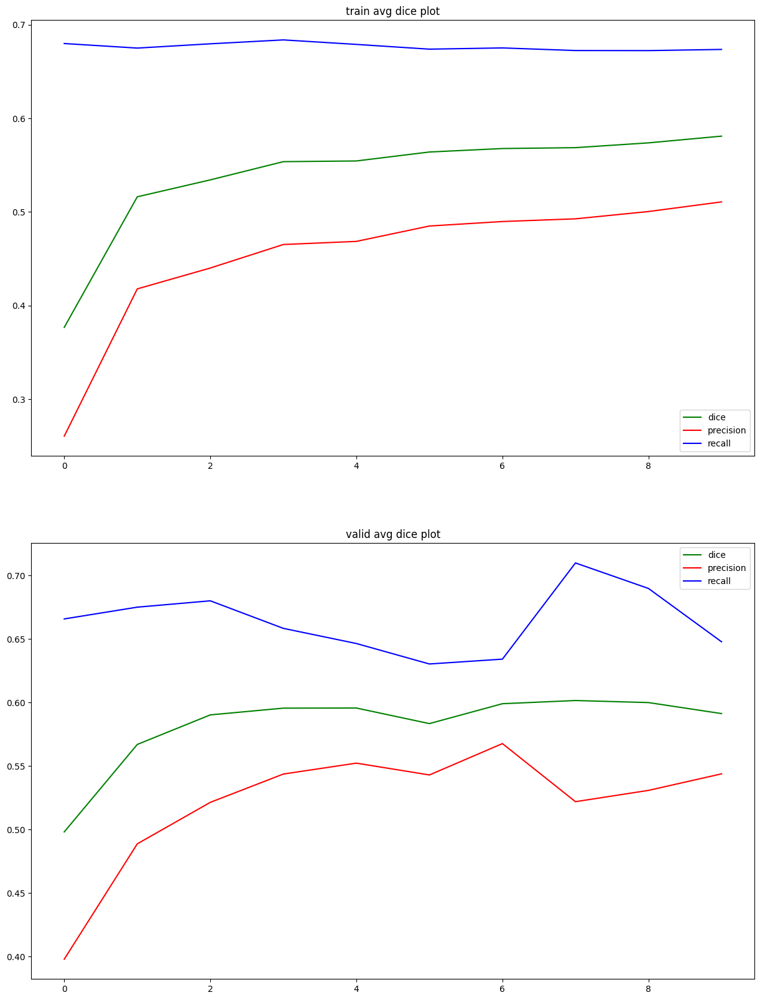

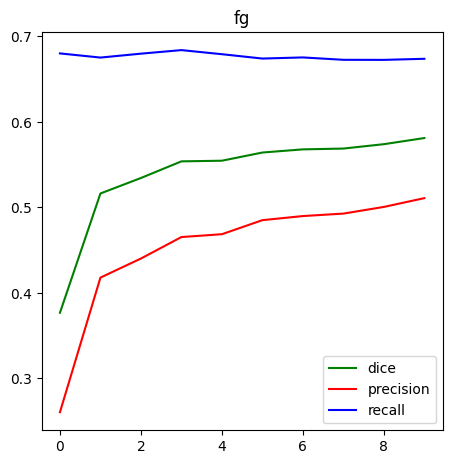

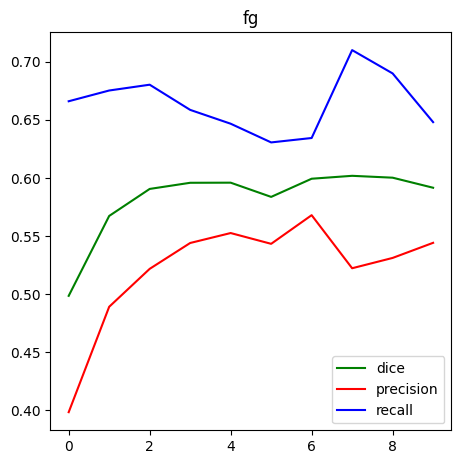

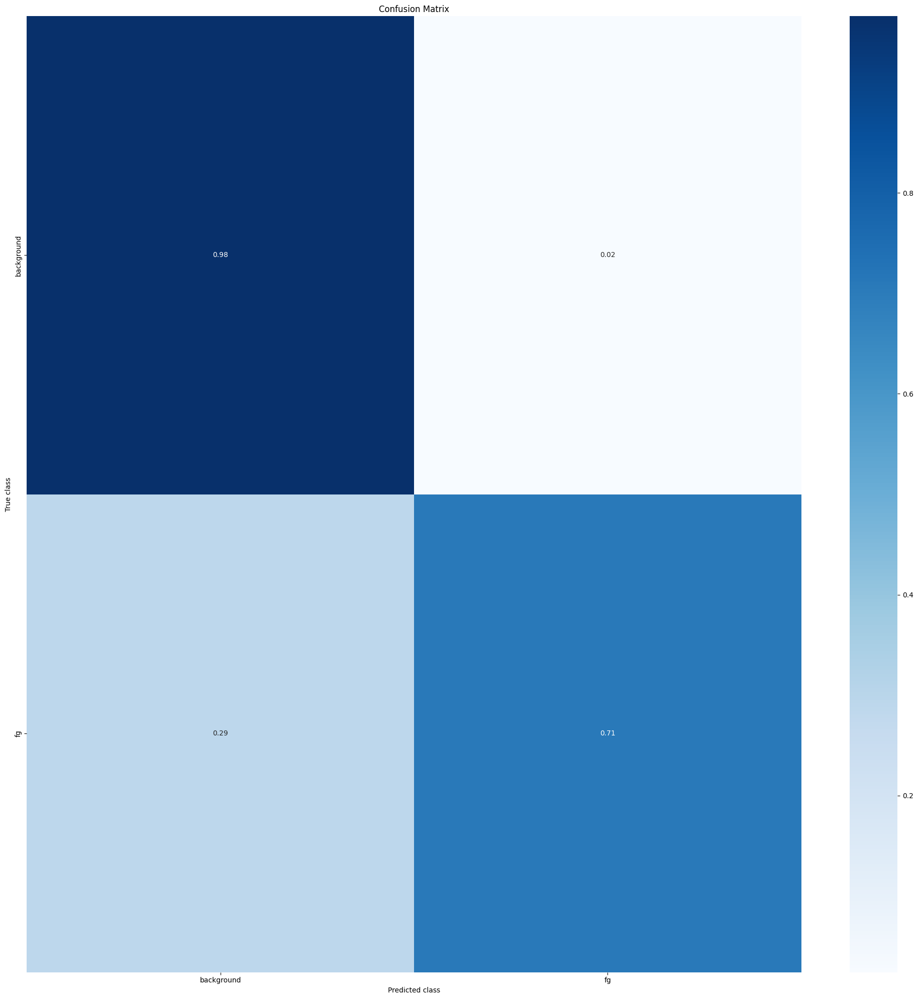

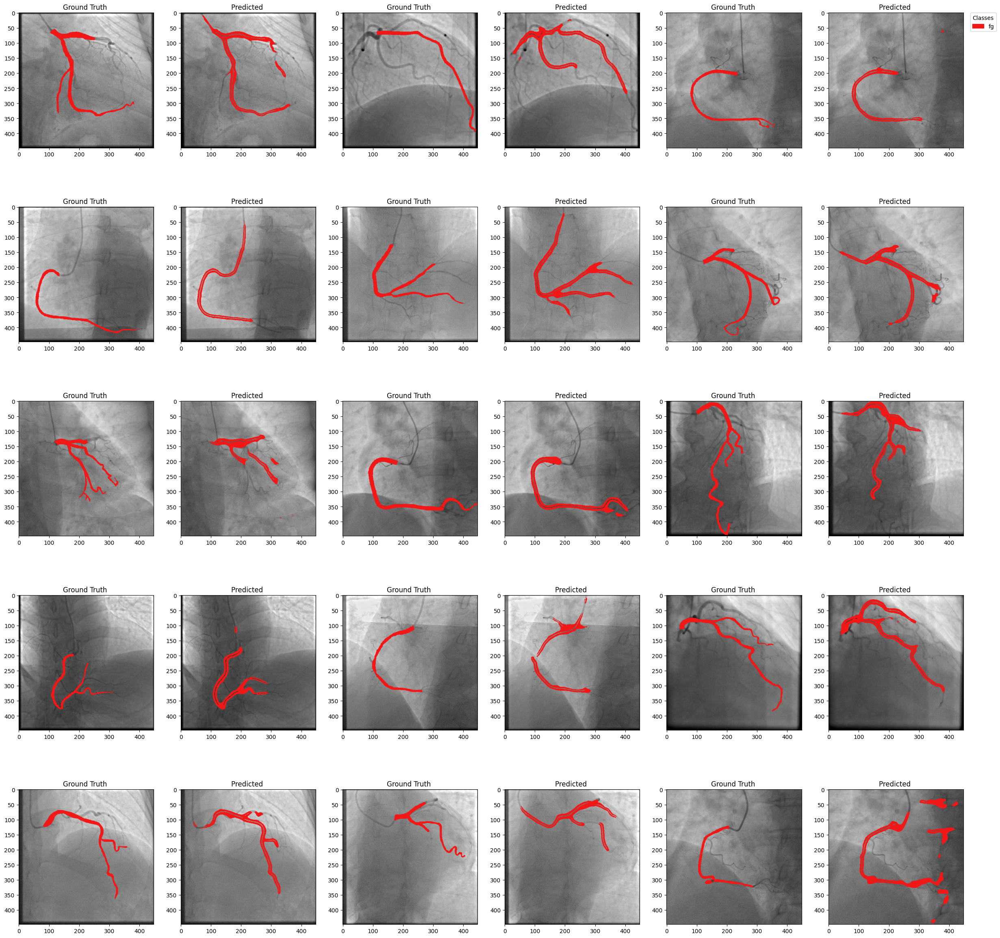

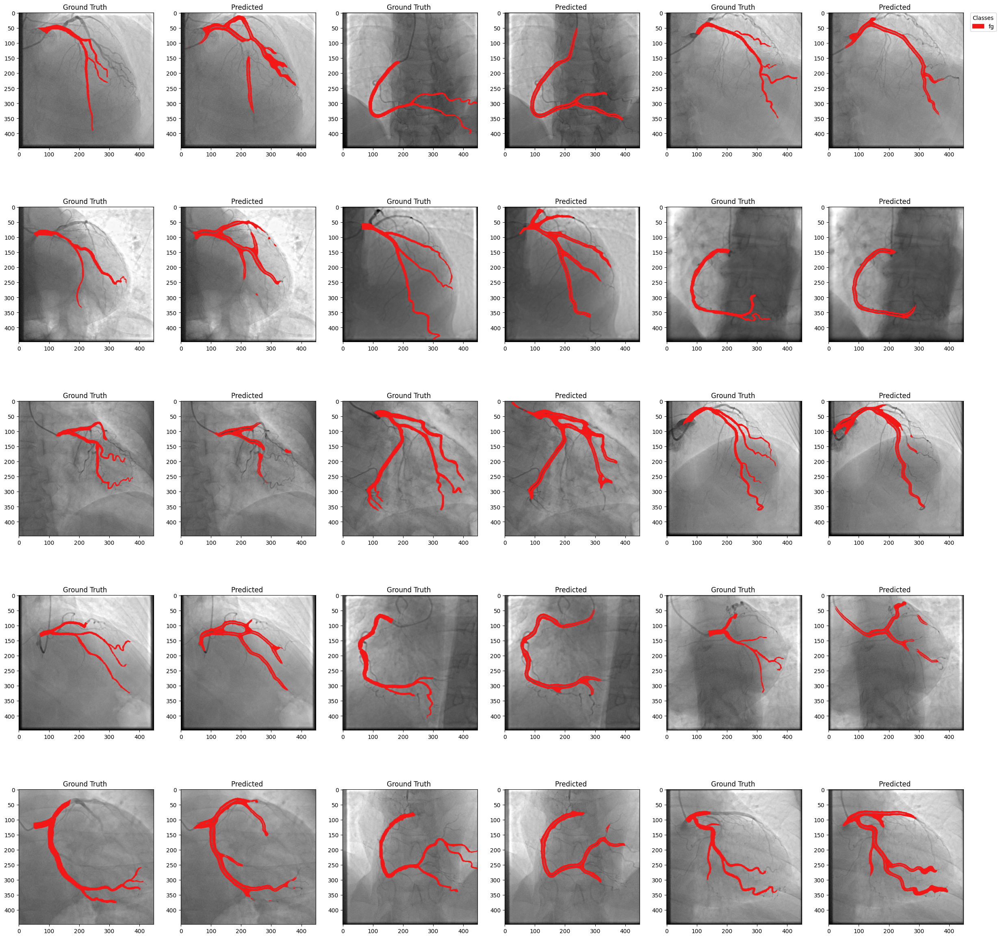

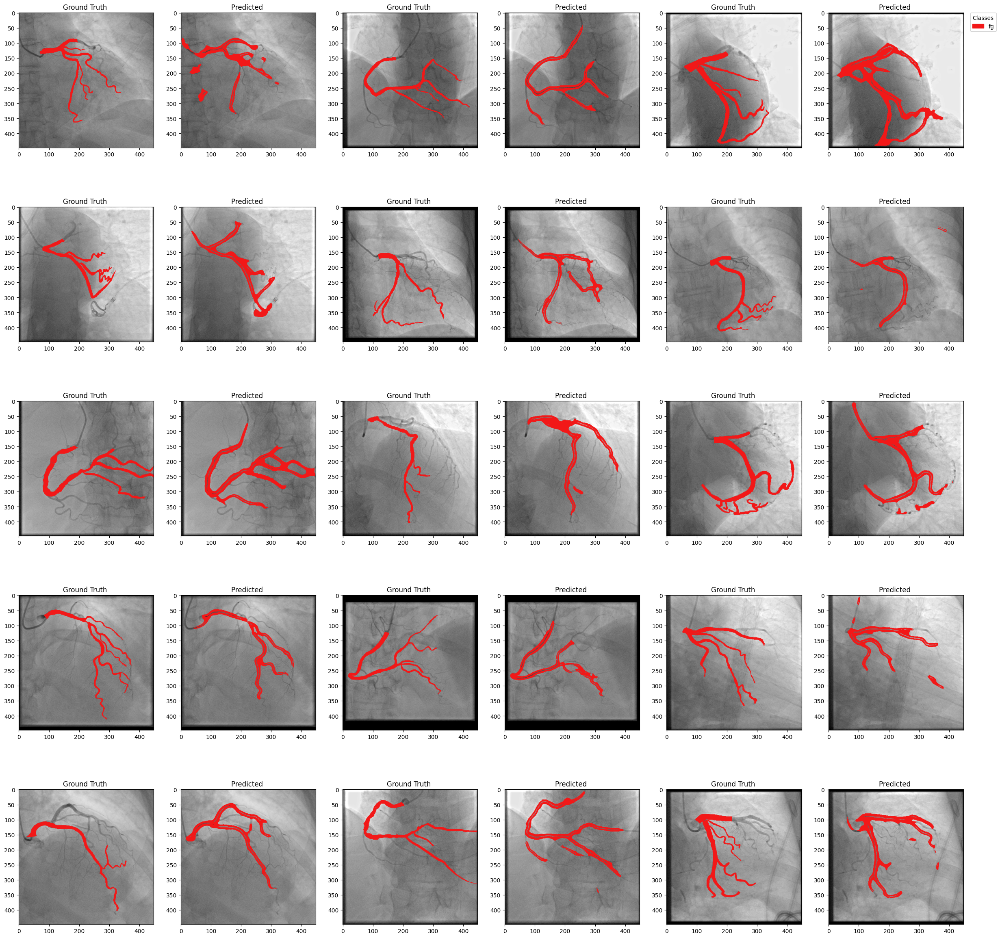

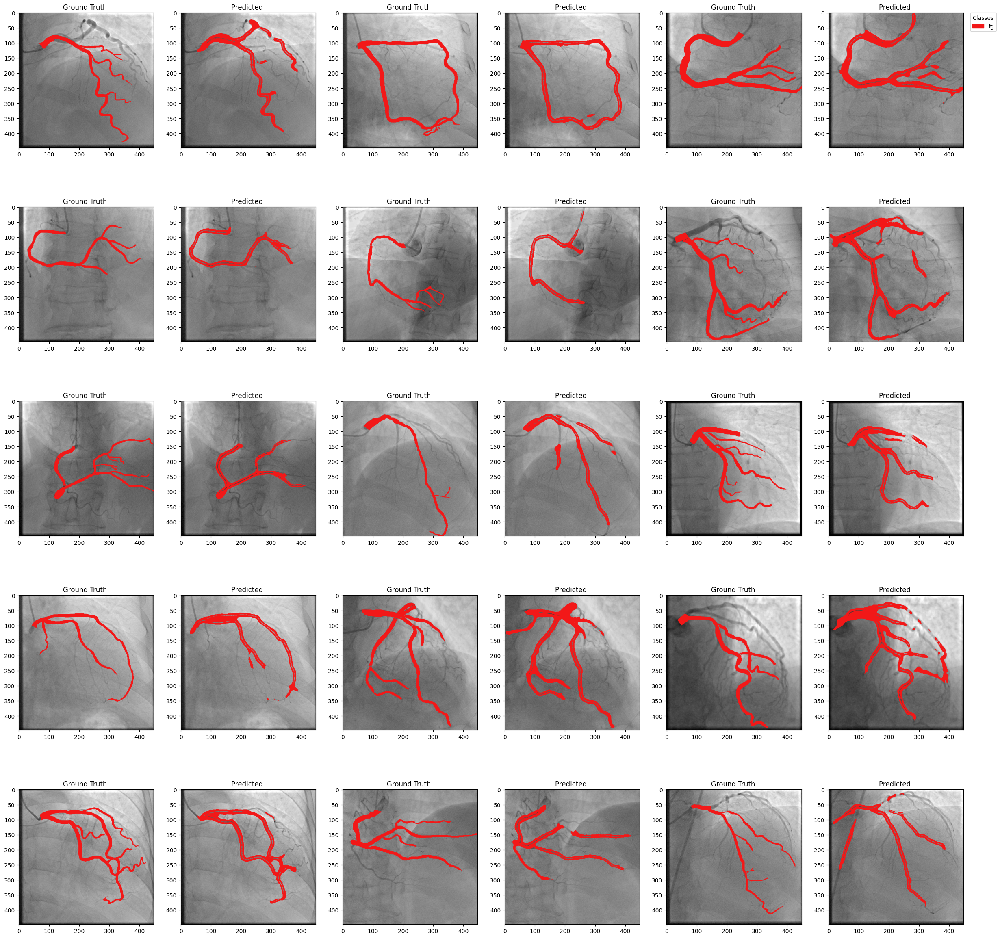

In [9]:
save_full_report(
    recorder= recorder , 
    output_base_path=args["output_base_path"],
    model=best_model,
    valid_loader=valid_loader,
    normalizer = normalizer,
    args=args,
    class_map=class_map,
    name=args["name"],
    valid_images = valid_images,
    test_transforms = test_transforms,
    notebook_name = "Multi_Main.ipynb",
    class_count = args["class_count"],
    device = args["device"],
    training_mode = args["training_mode"]
)